In [1]:
import cv2
from matplotlib import pyplot as plt
image_file = "SampleSchedule1A.png"
img = cv2.imread(image_file)

In [2]:
#https://stackoverflow.com/questions/28816046/
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()


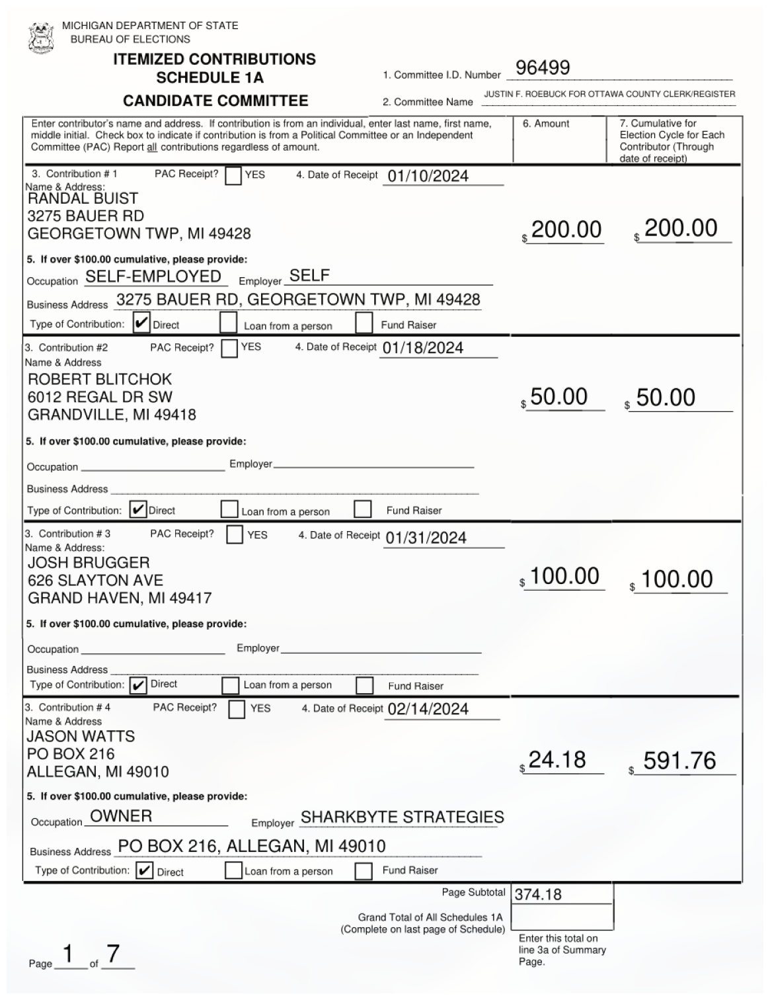

In [3]:
display(image_file)

# Inverted Images:

In [4]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg", inverted_image)

True

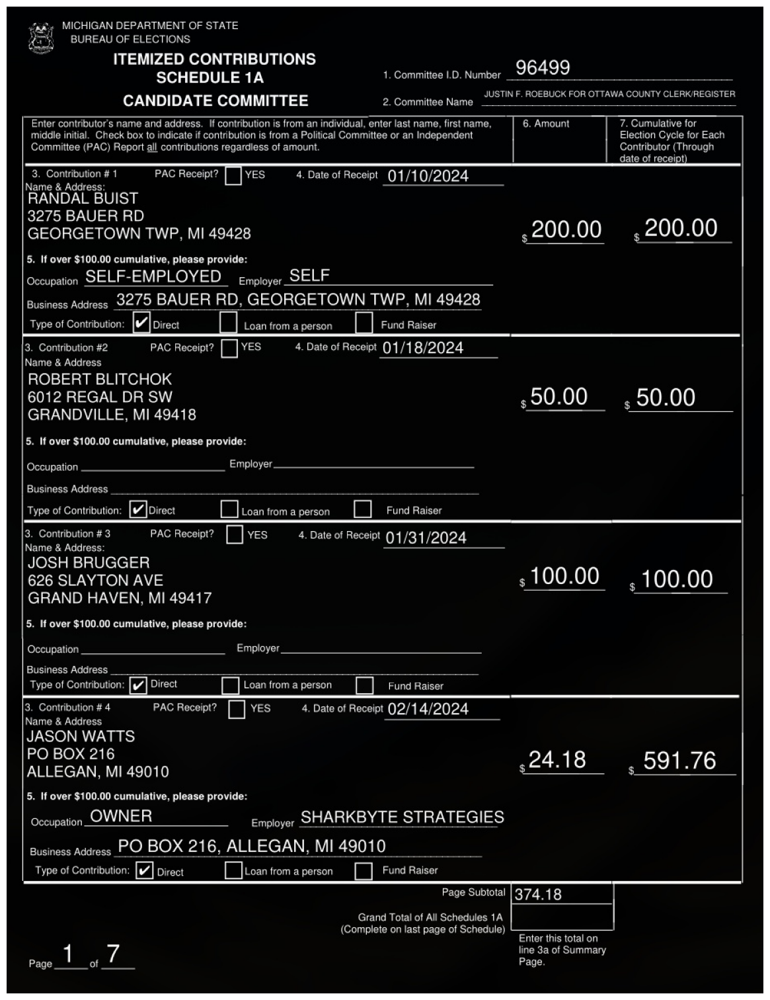

In [5]:
display("temp/inverted.jpg")

# Rescaling:

# Binarization:

In [6]:
def grayscale(image):
    return(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))

In [7]:
gray_image = grayscale(img)
cv2.imwrite("temp/gray.jpg", gray_image)

True

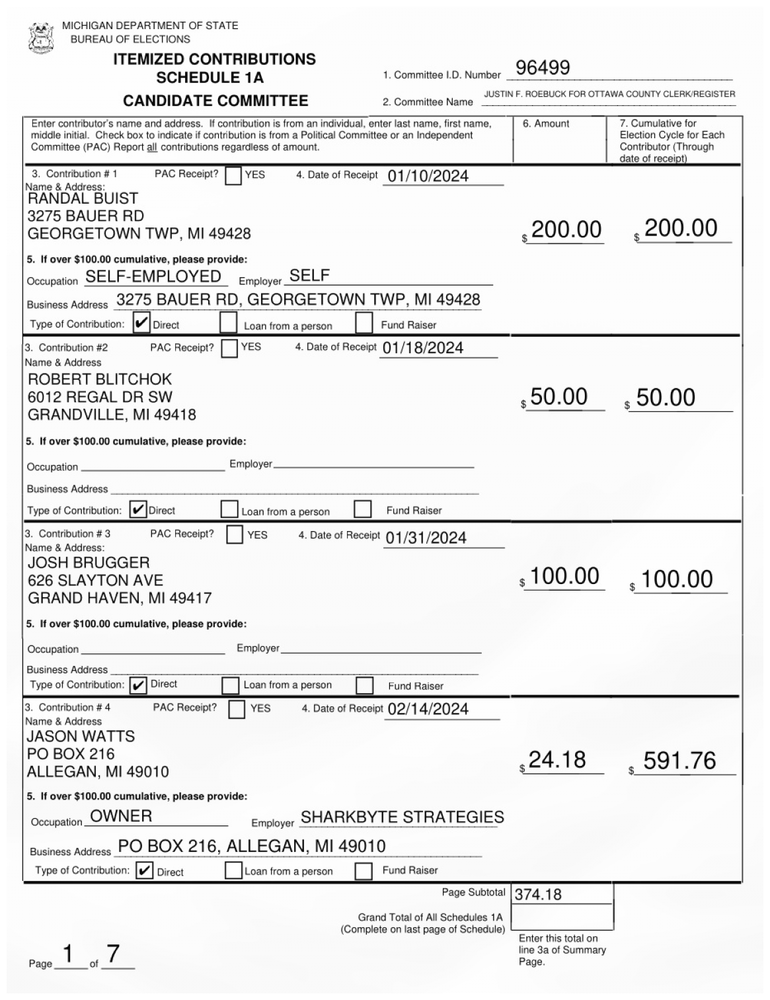

In [8]:
display("temp/gray.jpg")

In [9]:
tresh, im_bw = cv2.threshold(gray_image, 200, 230,  cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)

True

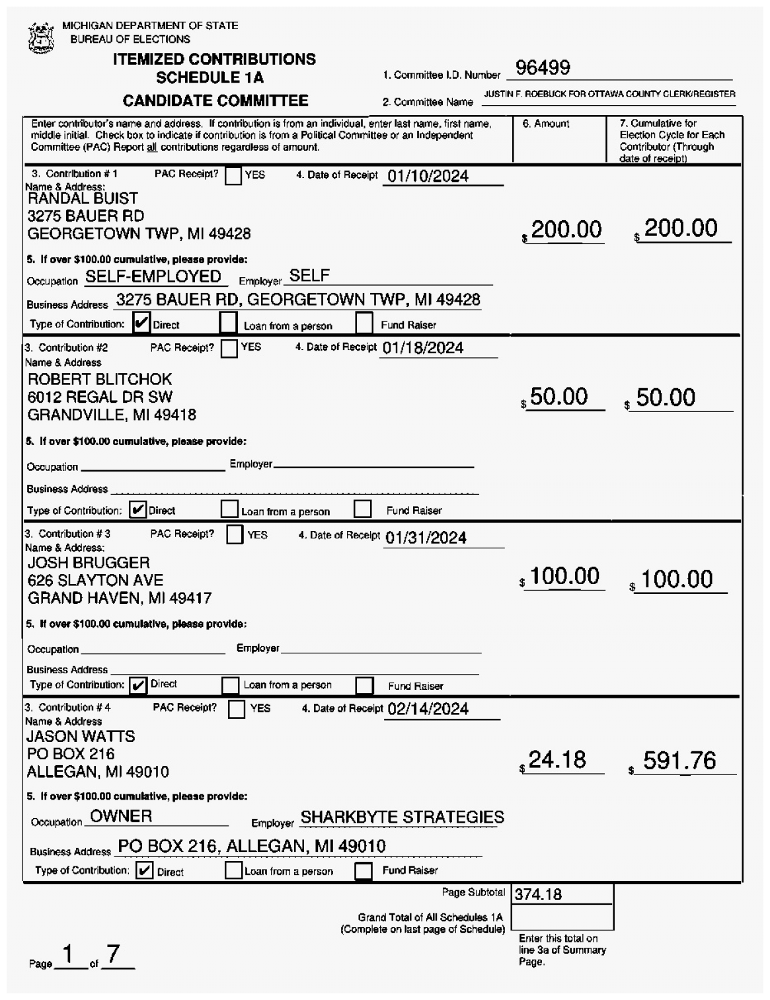

In [10]:
display("temp/bw_image.jpg")

# Noise Reduction

In [11]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations = 1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations = 1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return image

In [12]:
no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

True

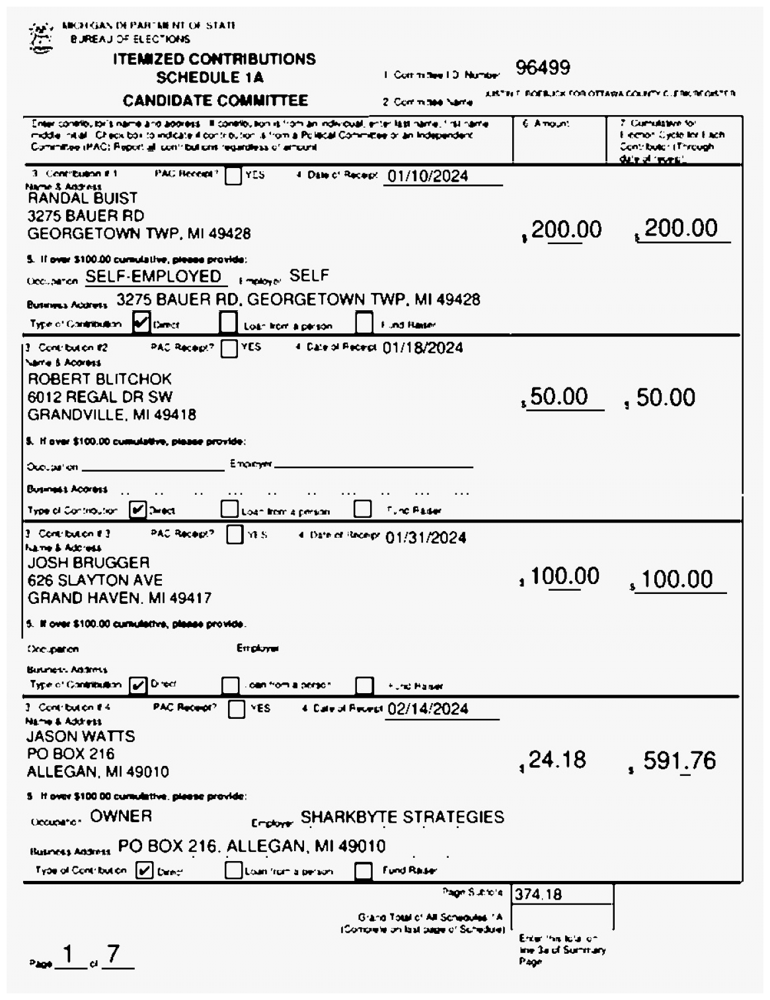

In [13]:
display("temp/no_noise.jpg")

Noice removal is not necessay in all cases. I don't think it would be used on these documents.

Consider passing the document to OCR software (pyTesseract) and testing output prior to noice removal.

# Dilation and Errosion:

In [14]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return image

In [15]:
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)

True

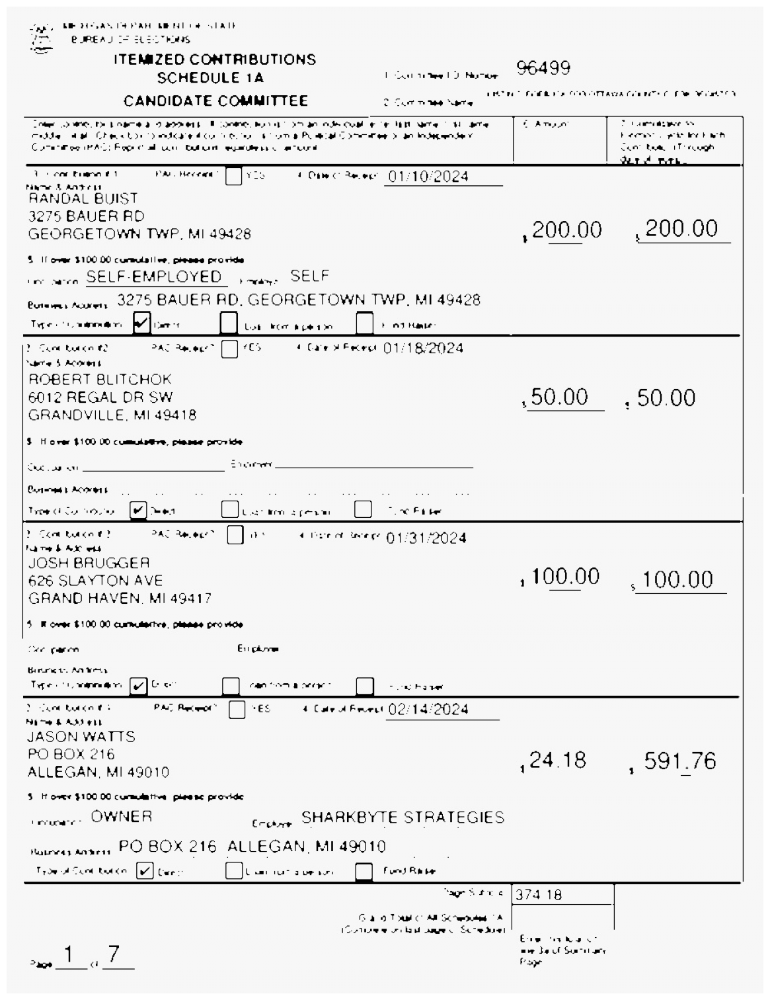

In [16]:
display("temp/eroded_image.jpg")

# Rotation and Deskewing

In [17]:
new = cv2.imread("RotatedSampleSchedule1A.jpg")

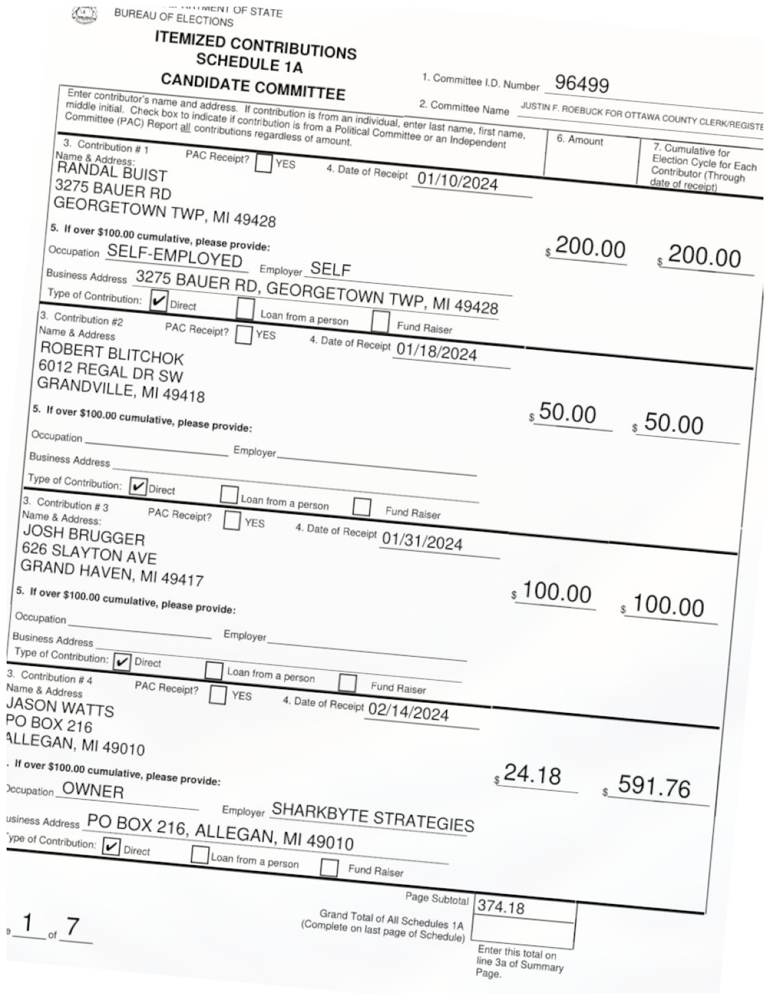

In [18]:
display("RotatedSampleSchedule1A.jpg")

In [19]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [20]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

42


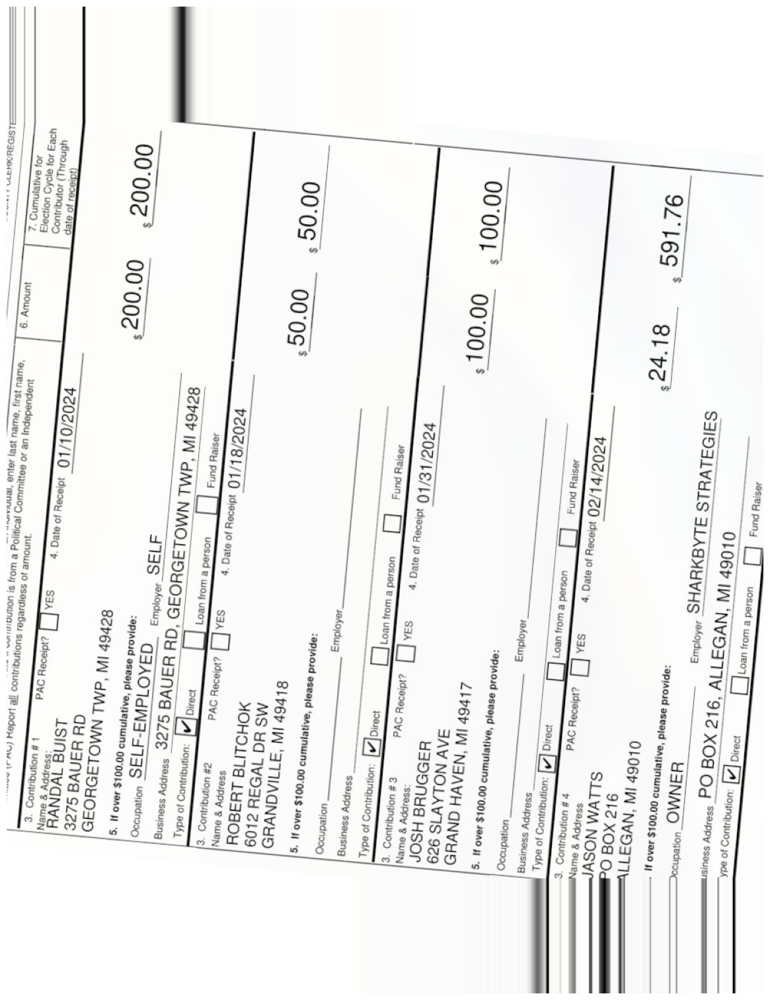

In [21]:
fixed = deskew(new)
cv2.imwrite("temp/derotated.jpg", fixed)
display("temp/derotated.jpg")

The boarders on my image are preventing the deskewing from working correctly, I'll either try a different image at somepoint, learn to remove boarders, or just not worry about it since skewed documents are unlikely in my target data set.

# Removing Boarders

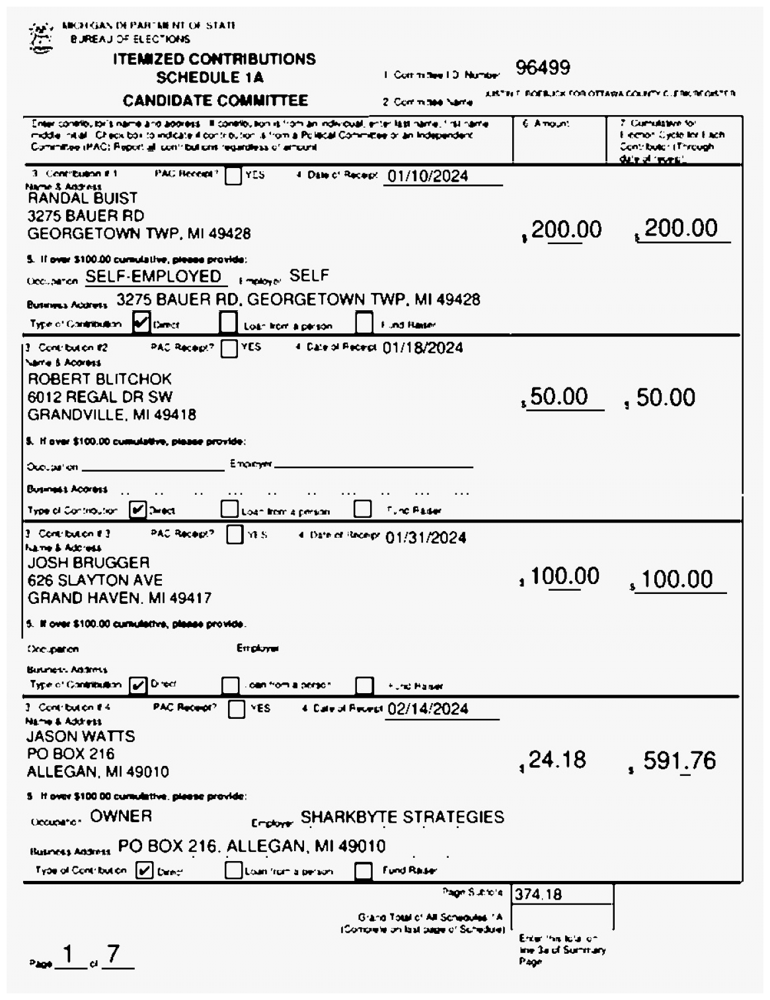

In [22]:
display("temp/no_noise.jpg")

In [23]:
def remove_boarder(image):
    contour, heirarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntSorted = sorted(contour, key= lambda x: cv2.contourArea(x))
    cnt = cntSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return crop

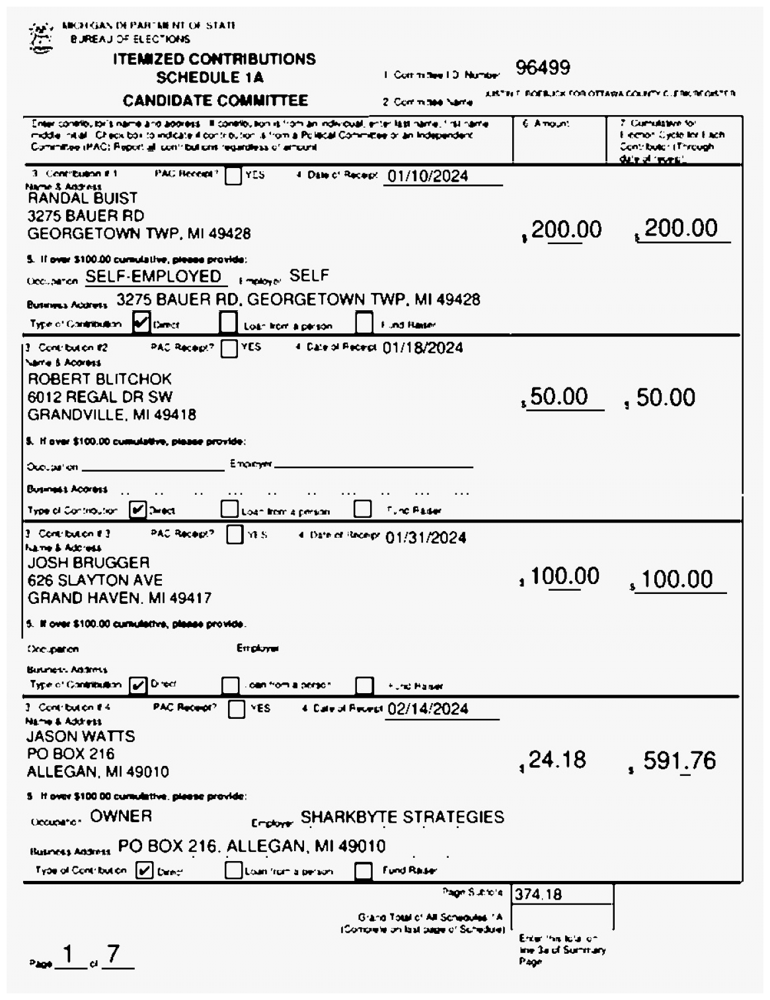

In [24]:
no_boarders = remove_boarder(no_noise)
cv2.imwrite("temp/no_boarders.jpg", no_boarders)
display("temp/no_boarders.jpg")

# Adding Missing boarders

In [25]:
color = [255, 255, 255]
top, bottom, left, right = [150] * 4

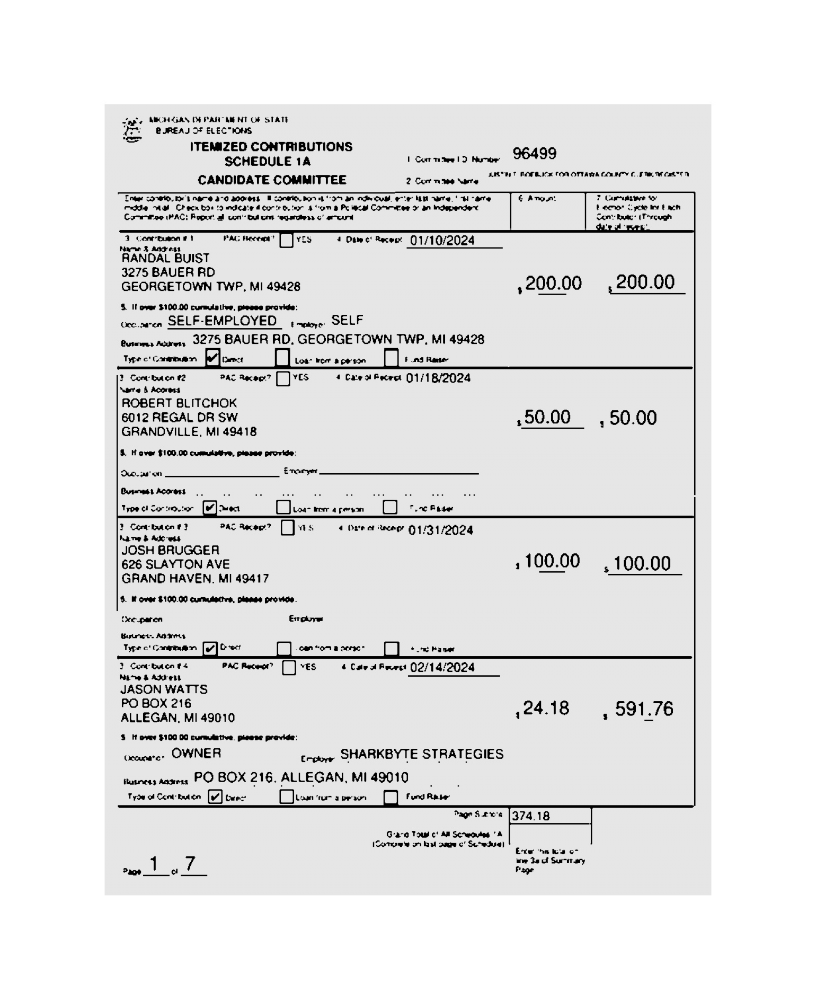

In [26]:
image_with_boarder = cv2.copyMakeBorder(no_boarders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_boarder.jpg", image_with_boarder)
display("temp/image_with_boarder.jpg")

In [27]:
import pytesseract
from PIL import Image

In [28]:
img = Image.open(image_file)
no_noise = "temp/no_noise.jpg"

In [29]:
ocr_result = pytesseract.image_to_string(no_noise)

In [30]:
print(ocr_result)

rate MCHGAN D PAR- AN NT OF STATE
BUREAJ OF ELECTIONS.

ITEMIZED CONTRIBUTIONS
SCHEDULE 1A | Cormann 1 e 96499
CANDIDATE COMMITTEE 2 Corr e g AT POFRIK CONOTTAA CORN € 07T

Trtwe corwio, 3 nb 270 2000131 o0, 00 11 0 2 e Oull_ 1w IH e ¥ BT
xKle A$ CFaca b1 20 mACH 4 ot 0, 4 0m & PO UM CamCor & 0 Indegendent
Comaniioo (PAC: Foper: al won' Dut o “egarabesa ¢ srcural

o e § ach

€ Amou | T Guriwer o
‘

3 ContTumn £ 1 PAG Recent” | YIS 4 Dawc Recer (01/10/2024
[rrpvern) Q1072024

RANDAL BUIST

3275 BAUER RD

GEORGETOWN TWP, MI 49428 ,200.00 200.00

1 over 3100.00 Cunmidalive, piess provide:
oc.oarcn SELF-EMPLOYED  { mquysr SELF

Bureras e 3275 BAUER RD, GEORGETOWN TWP, MI 49428

Type o Gl Carmct Lot~ MO 8 p# 300 i
T eed oac macewr [ |¥€5 ¢ Caw ol Prorst 01/18/2024
& § ACOrers

ROBERT BLITCHOK
6012 REGAL DR SW ,50.00 ,50.00
GRANDVILLE. MI 49418 =

8. H over $100.00 cumulstive, puesee provide:
Ouew'on Epe
Bursas Acowrs

Trow ot Soreoiar [V] e Loa- ko 2 peryan TLnc Bade

1 Com: 1 PAC Racowr® P

# Adding Bounding Boxes

In [31]:
img = cv2.imread("SampleSchedule1A.png")

In [32]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


In [33]:
cv2.imwrite("temp/img_gray.png", gray)

True

In [34]:
blur = cv2.GaussianBlur(gray, (7,7), 0)

In [35]:
cv2.imwrite("temp/img_blur.png", blur)

True

In [36]:
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

In [37]:
cv2.imwrite("temp/img_thresh.png", thresh)

True

In [38]:
kernal = cv2.getStructuringElement(cv2.MORPH_RECT, (3,13))

In [39]:
cv2.imwrite("temp/img_kernal.png", kernal)

True

In [40]:
dilate = cv2.dilate(thresh, kernal, iterations=1)

In [41]:
cv2.imwrite("temp/img_dilate.png", dilate)

True

In [42]:
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [43]:
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

In [44]:
cnts = sorted(cnts, key = lambda x: cv2.boundingRect(x)[0])

In [ ]:
for c in cnts:
    x, y, w, h = cv2.boundingRect(c)
    if h > 200 and w > 20:  #maybe this will fix bounding boxes
        cv2.rectangle(img, (x,y), (x+w, y+h), (36, 255, 12), 2)

cv2.imwrite("temp/img_bbox.png", img)

True

At this point I think I would need to modify parameters to get the bounding boxes in the correct areas, hopefully the video will cover this, but our bounding boxes are not currently where we would need them.